# Предустановки

In [1]:
!python -c "import monai" || pip install "monai-weekly[nibabel]"
!python -c "import matplotlib" || pip install matplotlib
!python -c "import pytorch_lightning" || pip install pytorch-lightning~=2.0
%matplotlib inline

Traceback (most recent call last):
  File "<string>", line 1, in <module>
ModuleNotFoundError: No module named 'monai'
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.4/1.4 MB 16.2 MB/s eta 0:00:0000:010:01


In [2]:
import zipfile
import glob
import matplotlib.pyplot as plt
import torch
from monai.utils import set_determinism, first
from monai.transforms import (Compose, Orientationd, LoadImaged,
                              EnsureChannelFirstd, ScaleIntensityRanged,
                              CropForegroundd, EnsureType, AsDiscrete, Spacingd)
from monai.data import Dataset, DataLoader
from monai.visualize import blend_images

import pytorch_lightning
from monai.networks.nets import UNet
from monai.networks.layers import Norm
from monai.losses import DiceLoss
from monai.transforms import (EnsureType, RandCropByPosNegLabeld, AsDiscrete)
from monai.metrics import DiceMetric
from monai.data import decollate_batch, list_data_collate, CacheDataset
import monai
from monai.inferers import sliding_window_inference

2024-05-14 09:00:01.373151: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-05-14 09:00:01.373267: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-05-14 09:00:01.501402: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered


# Загрузка и отображение датасета

In [3]:
images = sorted(glob.glob('../input/3d-liver-segmentation/Task03_Liver_rs/imagesTr/*.nii'))
labels = sorted(glob.glob('../input/3d-liver-segmentation/Task03_Liver_rs/labelsTr/*.nii'))

In [4]:
len(images)

123

In [5]:
assert len(images)==len(labels)

In [6]:
data_dicts = [{"image": image_name, "label": label_name} for image_name, label_name in zip(images, labels)]

In [7]:
set_determinism(seed=0)

In [8]:
transform = Compose(
    [
        LoadImaged(keys=["image", "label"]),
        EnsureChannelFirstd(keys=["image", "label"]),
        Orientationd(keys=["image", "label"], axcodes="PLS"),
        Spacingd(keys=["image", "label"], pixdim=(1.5, 1.5, 2.0), mode=("bilinear", "nearest")),
        ScaleIntensityRanged(keys=["image"], a_min=-57, a_max=164, b_min=0.0, b_max=1.0, clip=True),
        CropForegroundd(keys=["image", "label"], source_key="image"),
    ]
)

/opt/conda/lib/python3.10/site-packages/monai/utils/deprecate_utils.py:321: FutureWarning: monai.transforms.croppad.dictionary CropForegroundd.__init__:allow_smaller: Current default value of argument `allow_smaller=True` has been deprecated since version 1.2. It will be changed to `allow_smaller=False` in version 1.5.
  warn_deprecated(argname, msg, warning_category)


In [9]:
check_ds = Dataset(data=data_dicts, transform=transform)
check_loader = DataLoader(check_ds, batch_size=1)
data = first(check_loader)
print(f"image shape: {data['image'].shape}, label shape: {data['label'].shape}")

image shape: torch.Size([1, 1, 166, 233, 187]), label shape: torch.Size([1, 1, 166, 233, 187])


In [10]:
ret = blend_images(image=data["image"][0], label=data["label"][0], alpha=0.5, cmap="hsv", rescale_arrays=False)
print(ret.shape)

torch.Size([3, 166, 233, 187])


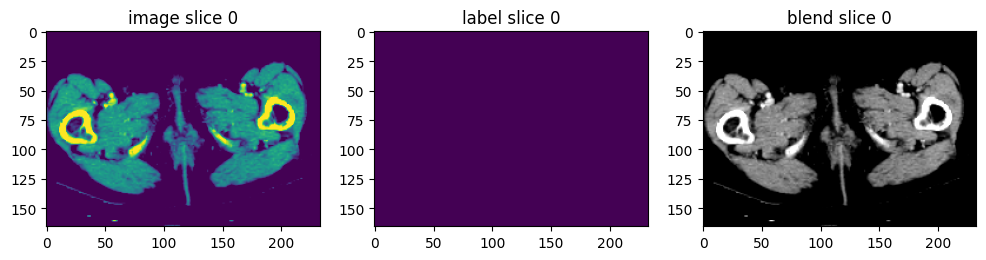

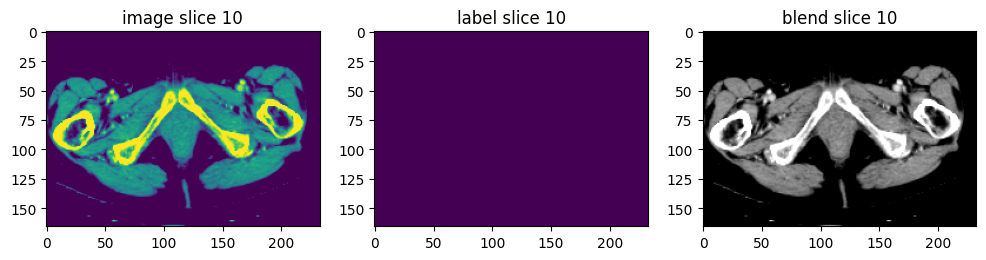

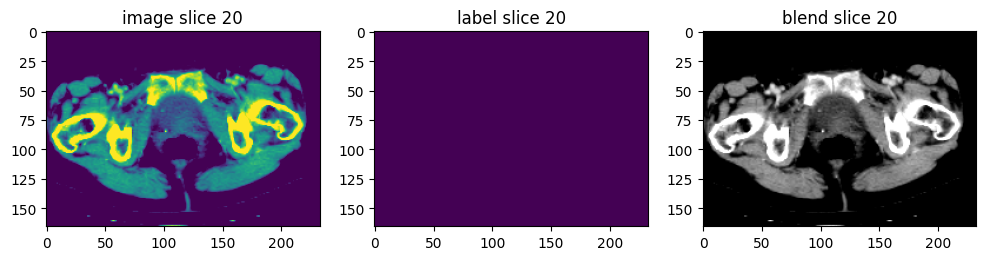

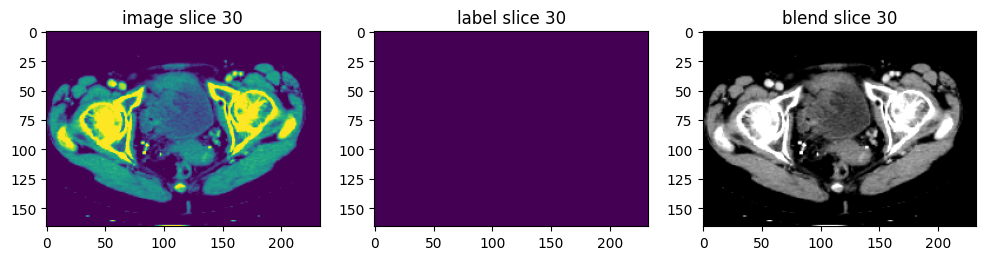

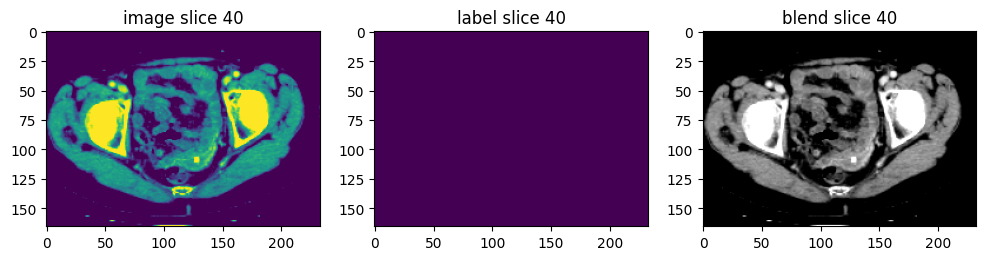

...

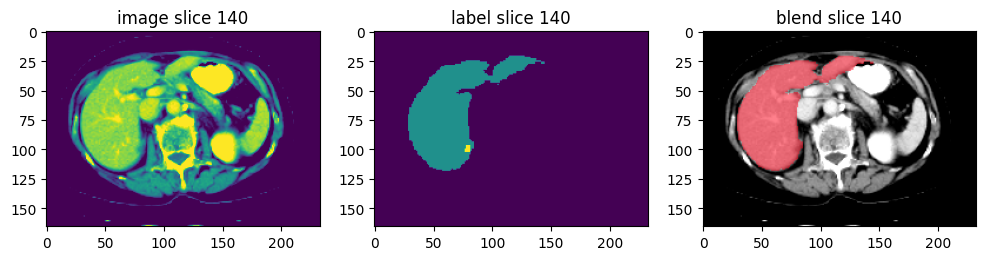

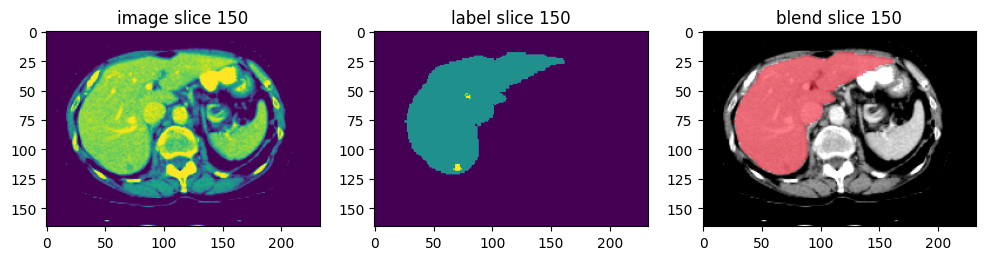

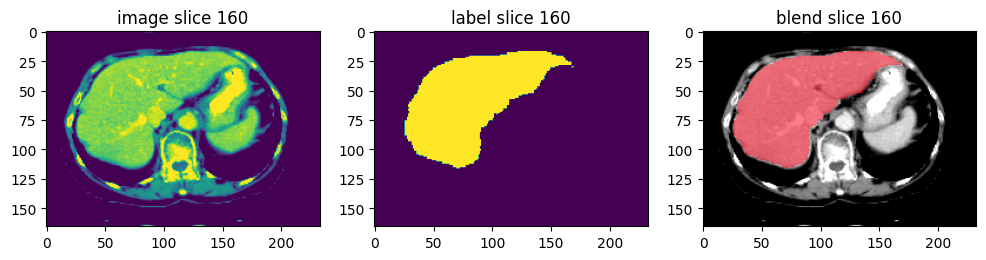

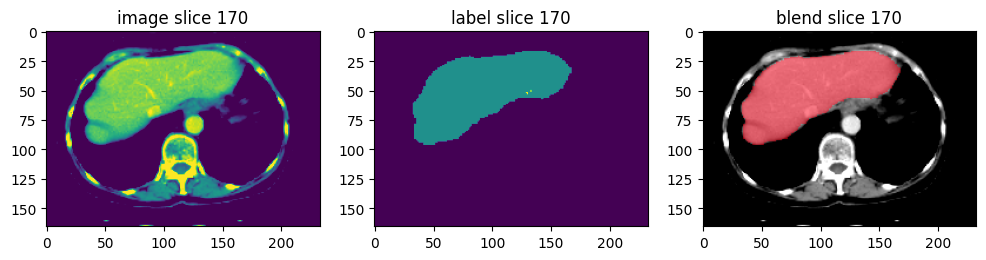

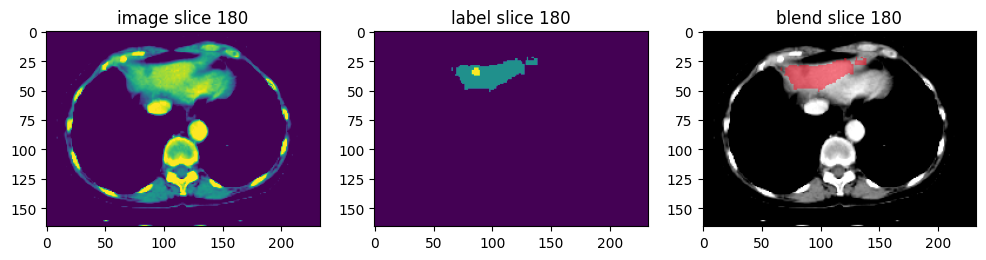

In [11]:
for i in range(0, 19):
    # plot the slice 0 - 180 of image, label and blend result
    slice_index = i * 10
    plt.figure("blend image and label", (12, 4))
    plt.subplot(1, 3, 1)
    plt.title(f"image slice {slice_index}")
    plt.imshow(data["image"][0, 0, :, :, slice_index])
    plt.subplot(1, 3, 2)
    plt.title(f"label slice {slice_index}")
    plt.imshow(data["label"][0, 0, :, :, slice_index])
    plt.subplot(1, 3, 3)
    plt.title(f"blend slice {slice_index}")
    # switch the channel dim to the last dim
    plt.imshow(torch.moveaxis(ret[:, :, :, slice_index], 0, -1))
    plt.show()

# Define the LightningModule

In [12]:
class Net(pytorch_lightning.LightningModule):
    def __init__(self):
        super().__init__()
        self._model = UNet(
            spatial_dims=3,
            in_channels=1,
            out_channels=5,
            channels=(16, 32, 64, 128, 256),
            strides=(2, 2, 2, 2),
            num_res_units=2,
            norm=Norm.BATCH,
        )
        self.loss_function = DiceLoss(to_onehot_y=True, softmax=True)
        self.post_pred = Compose([EnsureType("tensor", device="cpu"), AsDiscrete(argmax=True, to_onehot=5)])
        self.post_label = Compose([EnsureType("tensor", device="cpu"), AsDiscrete(to_onehot=5)])
        self.dice_metric = DiceMetric(include_background=False, reduction="mean", get_not_nans=False)
        self.best_val_dice = 0
        self.best_val_epoch = 0
        self.validation_step_outputs = []

    def forward(self, x):
        return self._model(x)

    def prepare_data(self):
        # set up the correct data path
        train_images = sorted(glob.glob('../input/3d-liver-segmentation/Task03_Liver_rs/imagesTr/*.nii'))
        train_labels = sorted(glob.glob('../input/3d-liver-segmentation/Task03_Liver_rs/labelsTr/*.nii'))
        data_dicts = [
            {"image": image_name, "label": label_name} for image_name, label_name in zip(train_images, train_labels)
        ]
        train_files, val_files = data_dicts[:-24], data_dicts[-24:]
        #train_files, val_files = data_dicts[:-62], data_dicts[-62:]
        #train_files, val_files = data_dicts[:-103], data_dicts[-20:]

        # set deterministic training for reproducibility
        set_determinism(seed=0)

        # define the data transforms
        train_transforms = Compose(
            [
                LoadImaged(keys=["image", "label"]),
                EnsureChannelFirstd(keys=["image", "label"]),
                Orientationd(keys=["image", "label"], axcodes="RAS"),
                Spacingd(
                    keys=["image", "label"],
                    pixdim=(1.5, 1.5, 2.0),
                    mode=("bilinear", "nearest"),
                ),
                ScaleIntensityRanged(
                    keys=["image"],
                    a_min=-57,
                    a_max=164,
                    b_min=0.0,
                    b_max=1.0,
                    clip=True,
                ),
                CropForegroundd(keys=["image", "label"], source_key="image"),
                # randomly crop out patch samples from
                # big image based on pos / neg ratio
                # the image centers of negative samples
                # must be in valid image area
                RandCropByPosNegLabeld(
                    keys=["image", "label"],
                    label_key="label",
                    spatial_size=(32, 32, 32),
                    pos=1,
                    neg=1,
                    num_samples=4,
                    image_key="image",
                    image_threshold=0,
                ),
                # user can also add other random transforms
                #                 RandAffined(
                #                     keys=['image', 'label'],
                #                     mode=('bilinear', 'nearest'),
                #                     prob=1.0,
                #                     spatial_size=(96, 96, 96),
                #                     rotate_range=(0, 0, np.pi/15),
                #                     scale_range=(0.1, 0.1, 0.1)),
            ]
        )
        val_transforms = Compose(
            [
                LoadImaged(keys=["image", "label"]),
                EnsureChannelFirstd(keys=["image", "label"]),
                Orientationd(keys=["image", "label"], axcodes="RAS"),
                Spacingd(
                    keys=["image", "label"],
                    pixdim=(1.5, 1.5, 2.0),
                    mode=("bilinear", "nearest"),
                ),
                ScaleIntensityRanged(
                    keys=["image"],
                    a_min=-57,
                    a_max=164,
                    b_min=0.0,
                    b_max=1.0,
                    clip=True,
                ),
                CropForegroundd(keys=["image", "label"], source_key="image"),
            ]
        )
        
        # we use cached datasets - these are 10x faster than regular datasets
        self.train_ds = CacheDataset(
            data=train_files,
            transform=train_transforms,
            cache_rate=1.0,
            num_workers=4,
        )
        self.val_ds = CacheDataset(
            data=val_files,
            transform=val_transforms,
            cache_rate=1.0,
            num_workers=4,
        )
        '''
        self.train_ds = monai.data.Dataset(
            data=train_files, transform=train_transforms)
        self.val_ds = monai.data.Dataset(
          data=val_files, transform=val_transforms)
        '''

    def train_dataloader(self):
        train_loader = DataLoader(
            self.train_ds,
            batch_size=2,
            shuffle=True,
            num_workers=3,
            collate_fn=list_data_collate,
        )
        return train_loader

    def val_dataloader(self):
        val_loader = DataLoader(self.val_ds, batch_size=1, num_workers=4)
        return val_loader

    def configure_optimizers(self):
        optimizer = torch.optim.Adam(self._model.parameters(), 1e-4)
        return optimizer

    def training_step(self, batch, batch_idx):
        images, labels = batch["image"], batch["label"]
        output = self.forward(images)
        loss = self.loss_function(output, labels)
        tensorboard_logs = {"train_loss": loss.item()}
        return {"loss": loss, "log": tensorboard_logs}

    def validation_step(self, batch, batch_idx):
        images, labels = batch["image"], batch["label"]
        roi_size = (160, 160, 160)
        sw_batch_size = 4
        outputs = sliding_window_inference(images, roi_size, sw_batch_size, self.forward)
        loss = self.loss_function(outputs, labels)
        outputs = [self.post_pred(i) for i in decollate_batch(outputs)]
        labels = [self.post_label(i) for i in decollate_batch(labels)]
        self.dice_metric(y_pred=outputs, y=labels)
        d = {"val_loss": loss, "val_number": len(outputs)}
        self.validation_step_outputs.append(d)
        return d

    def on_validation_epoch_end(self):
        val_loss, num_items = 0, 0
        for output in self.validation_step_outputs:
            val_loss += output["val_loss"].sum().item()
            num_items += output["val_number"]
        mean_val_dice = self.dice_metric.aggregate().item()
        self.dice_metric.reset()
        mean_val_loss = torch.tensor(val_loss / num_items)
        tensorboard_logs = {
            "val_dice": mean_val_dice,
            "val_loss": mean_val_loss,
        }
        if mean_val_dice > self.best_val_dice:
            self.best_val_dice = mean_val_dice
            self.best_val_epoch = self.current_epoch
        print(
            f"current epoch: {self.current_epoch} "
            f"current mean dice: {mean_val_dice:.4f}"
            f"\nbest mean dice: {self.best_val_dice:.4f} "
            f"at epoch: {self.best_val_epoch}"
        )
        self.validation_step_outputs.clear()  # free memory
        return {"log": tensorboard_logs}

# Run the training

In [13]:
# initialise the LightningModule
net = Net()

In [14]:
# set up loggers and checkpoints
log_dir = 'logs'
tb_logger = pytorch_lightning.loggers.TensorBoardLogger(save_dir=log_dir)

In [15]:
net = Net.load_from_checkpoint('../input/checkpoint-0-5670/epoch99-step5000.ckpt')

In [16]:
# initialise Lightning's trainer.
trainer = pytorch_lightning.Trainer(
    devices=[0],
    max_epochs=10,
    logger=tb_logger,
    enable_checkpointing=True,
    num_sanity_val_steps=1,
    log_every_n_steps=16,
)

# train
trainer.fit(net)

Loading dataset: 100%|██████████| 24/24 [00:51<00:00,  2.16s/it]


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

current epoch: 0 current mean dice: 0.3491
best mean dice: 0.3491 at epoch: 0


Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

current epoch: 0 current mean dice: 0.4839
best mean dice: 0.4839 at epoch: 0


Validation: |          | 0/? [00:00<?, ?it/s]

current epoch: 1 current mean dice: 0.4872
best mean dice: 0.4872 at epoch: 1


Validation: |          | 0/? [00:00<?, ?it/s]

current epoch: 2 current mean dice: 0.4982
best mean dice: 0.4982 at epoch: 2


Validation: |          | 0/? [00:00<?, ?it/s]

current epoch: 3 current mean dice: 0.4969
best mean dice: 0.4982 at epoch: 2


Validation: |          | 0/? [00:00<?, ?it/s]

current epoch: 4 current mean dice: 0.5498
best mean dice: 0.5498 at epoch: 4


Validation: |          | 0/? [00:00<?, ?it/s]

current epoch: 5 current mean dice: 0.5563
best mean dice: 0.5563 at epoch: 5


Validation: |          | 0/? [00:00<?, ?it/s]

current epoch: 6 current mean dice: 0.5174
best mean dice: 0.5563 at epoch: 5


Validation: |          | 0/? [00:00<?, ?it/s]

current epoch: 7 current mean dice: 0.6146
best mean dice: 0.6146 at epoch: 7


Validation: |          | 0/? [00:00<?, ?it/s]

current epoch: 8 current mean dice: 0.4974
best mean dice: 0.6146 at epoch: 7


Validation: |          | 0/? [00:00<?, ?it/s]

current epoch: 9 current mean dice: 0.5391
best mean dice: 0.6146 at epoch: 7


In [17]:
print(f'BMD: {net.best_val_dice} at epoch {net.best_val_epoch}')

BMD: 0.6145963072776794 at epoch 7


# Check best model output with the input image and label

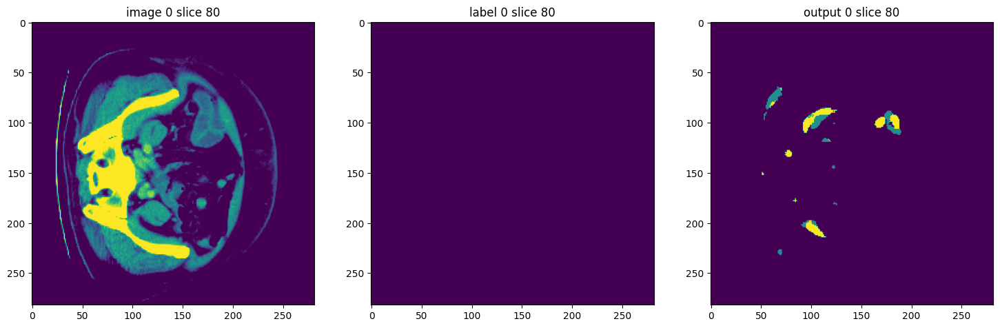

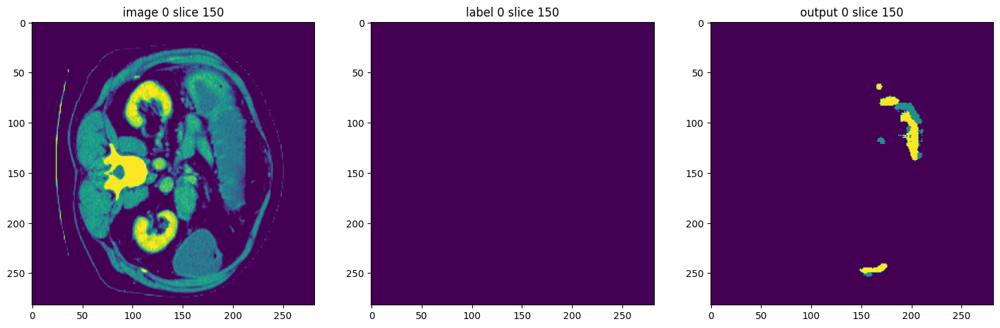

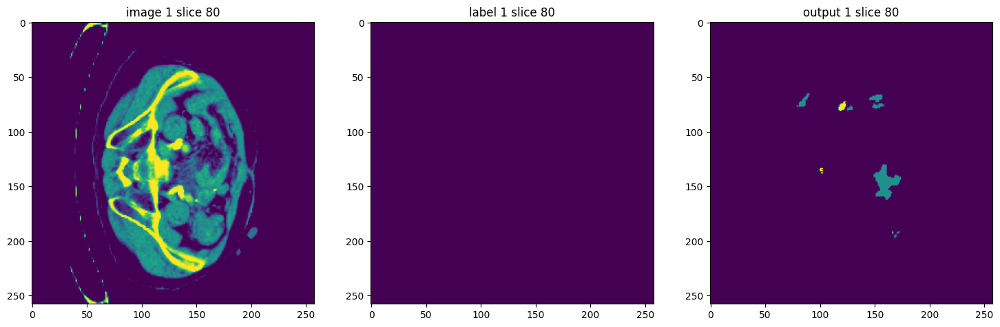

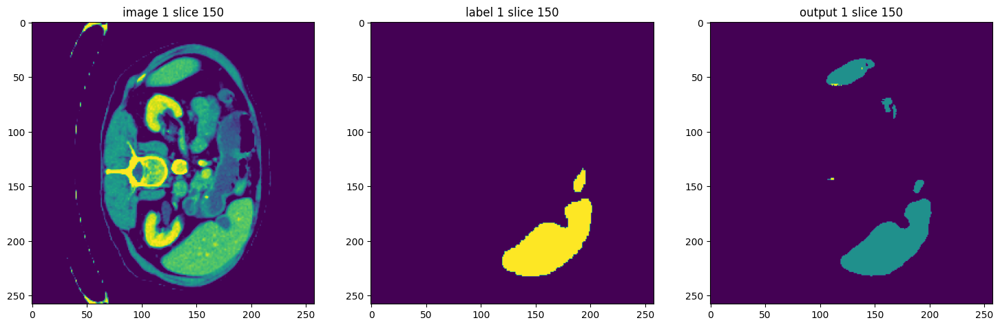

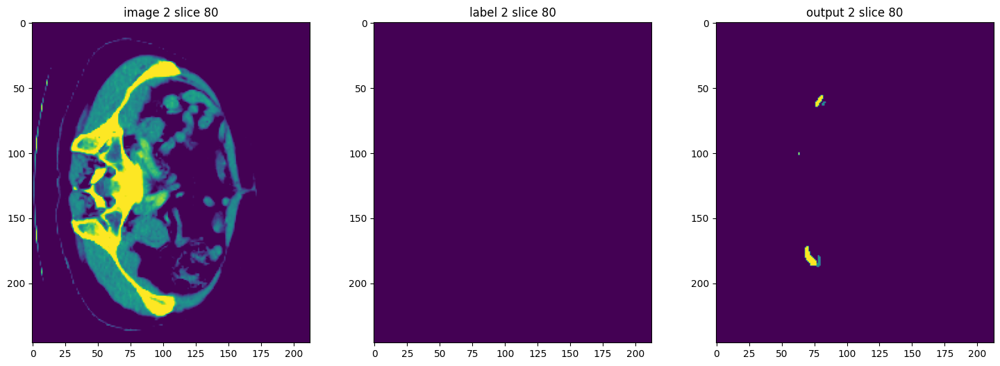

...

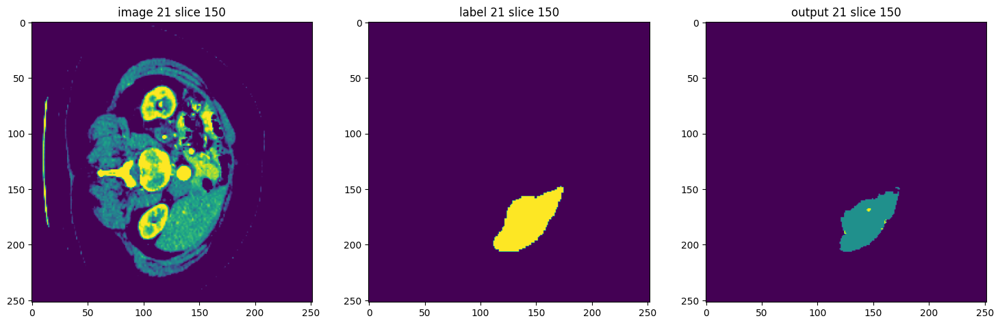

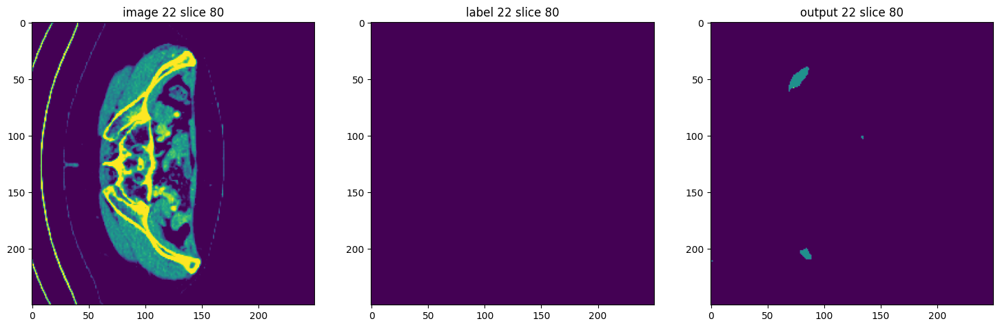

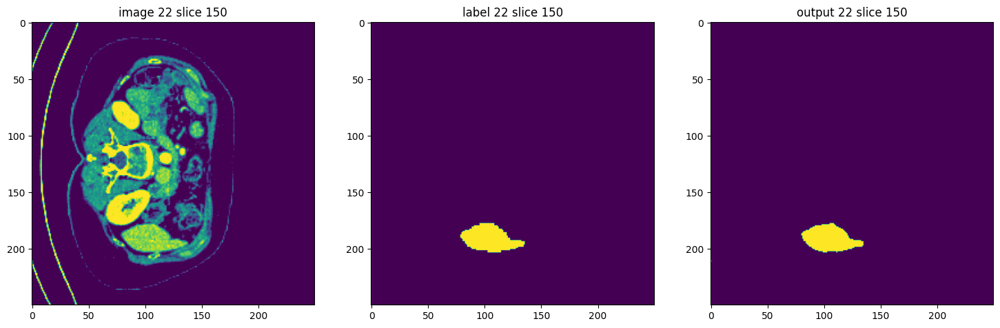

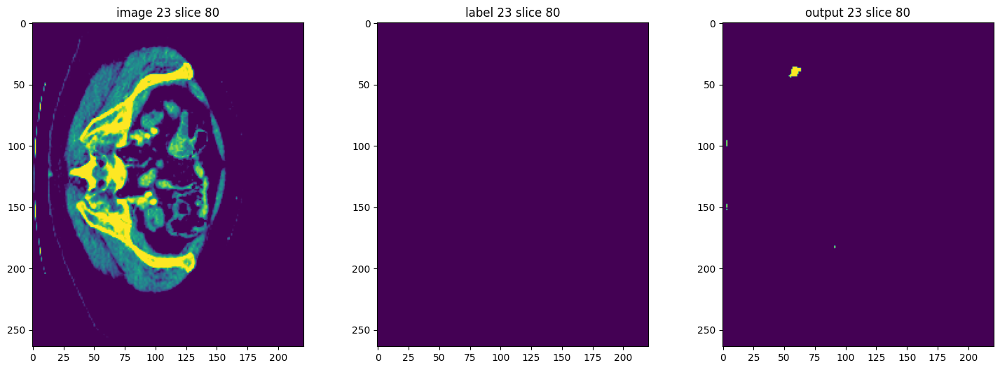

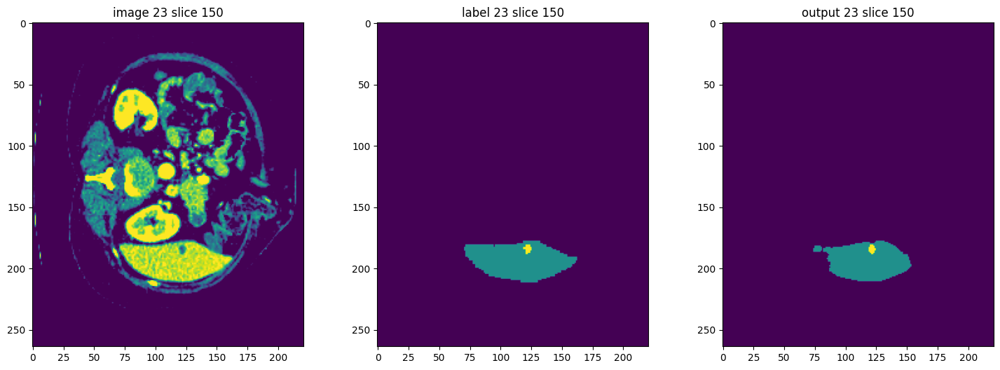

In [18]:
net.eval()
device = torch.device("cpu")
net.to(device)
with torch.no_grad():
    for i, val_data in enumerate(net.val_dataloader()):
        roi_size = (160, 160, 160)
        sw_batch_size = 4
        val_outputs = sliding_window_inference(val_data["image"].to(device), roi_size, sw_batch_size, net)
        # plot the slice [:, :, 80]
        plt.figure("check", (18, 6))
        plt.subplot(1, 3, 1)
        plt.title(f"image {i} slice 80")
        plt.imshow(val_data["image"][0, 0, :, :, 80])
        plt.subplot(1, 3, 2)
        plt.title(f"label {i} slice 80")
        plt.imshow(val_data["label"][0, 0, :, :, 80])
        plt.subplot(1, 3, 3)
        plt.title(f"output {i} slice 80")
        plt.imshow(torch.argmax(val_outputs, dim=1).detach().cpu()[0, :, :, 80])
        plt.show()
        # plot the slice [:, :, 150]
        plt.figure("check", (18, 6))
        plt.subplot(1, 3, 1)
        plt.title(f"image {i} slice 150")
        plt.imshow(val_data["image"][0, 0, :, :, 150])
        plt.subplot(1, 3, 2)
        plt.title(f"label {i} slice 150")
        plt.imshow(val_data["label"][0, 0, :, :, 150])
        plt.subplot(1, 3, 3)
        plt.title(f"output {i} slice 150")
        plt.imshow(torch.argmax(val_outputs, dim=1).detach().cpu()[0, :, :, 150])
        plt.show()